In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))


import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sb

sb.set()
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# Comparative evaluation of model-supported clustering methods

The following notebook compares the clustering quality and the number of clusters attained by the model-supported clustering methods of GeFaST, DADA2, USEARCH and VSEARCH.   
The evaluation uses the results on the Callahan data sets and on the Franzén data sets:
 - Callahan et al., *DADA2: High-resolution sample inference from Illumina amplicon data* (https://doi.org/10.1038/nmeth.3869)
 - Franzén et al., *Improved OTU-picking using long-read 16S rRNA gene amplicon sequencing and generic hierarchical clustering* (https://doi.org/10.1186/s40168-015-0105-6)
 
This evaluation relies on the CSV outputs of the notebooks of the evaluations specific to the different tools and data sets.
The required files are listed below.

### GeFaST variants
GeFaST is evaluated in different modes (`as`, `lev`, `cons`), with different clusterers (`classic`, `cons-classic`, `cons-swarmer`) and with different cluster refiners (`classic`, `cons-lsa`, `cons-lsr`, `cons-lss`).

The different variants are usually referred to by an abbreviation hinting at the mode, clusterer and refiner: `<mode/clusterer>__<refinement>`, e.g. `as__nf` and `lev_dada2-c__lsa1`.

Values of `<mode/clusterer>`:

| Abbreviation | Description |
| --: | :-- |
| as          | alignment-score mode with `classic` clusterer |
| as_dada2-c  | alignment-score mode with `cons-classic` clusterer |
| dada2-s     | consistency mode with `cons-swarmer` clusterer |
| lev         | Levenshtein mode with `classic` clusterer |
| lev_dada2-c | Levenshtein mode with `cons-classic` clusterer |

Values of `<refinement>`:

| Abbreviation | Description |
| --:  | :-- |
| nf   | no refinement |
| f1   | fastidious refinement with `classic` refiner, incremented refinement threshold (+1 for `lev` / `lev_cons`, +20 for `as` / `as_cons`) |
| 2f   | fastidious refinement with `classic` refiner, doubled refinement threshold doubled |
| lsa1 | consistency-based refinement with `cons-lsa` refiner (option 1) |
| lsa2 | consistency-based refinement with `cons-lsa` refiner (option 2) |
| lsa3 | consistency-based refinement with `cons-lsa` refiner (option 3) |
| lsa4 | consistency-based refinement with `cons-lsa` refiner (option 4) |
| lsr1 | consistency-based refinement with `cons-lsr` refiner (option 1) |
| lsr2 | consistency-based refinement with `cons-lsr` refiner (option 2) |
| lsr3 | consistency-based refinement with `cons-lsr` refiner (option 3) |
| lsr4 | consistency-based refinement with `cons-lsr` refiner (option 4) |
| lss  | consistency-based refinement with `cons-lss` refiner |


### DADA2 variant
DADA2 is included in the variant including chimera detection.


### USEARCH & VSEARCH variants

USEARCH is evaluated for the `cluster_fast` command with the option `-sort size`,
while VSEARCH is included in the variant using the `cluster_size` command. 

In [ ]:
# Required files:
#
# analyses
# |- model_supported_callahan  # evaluation of GeFaST's model-supported clustering methods on Callahan data
# |  \- evaluation
# |     |- df_joined_max_avg.csv
# |     |- df_joined_mean_avg.csv
# |     \- df_joined_nbest_avg.csv
# |
# |- model_supported_franzen  # evaluation of GeFaST's model-supported clustering methods on Franzén data
# |  \- evaluation
# |     |- df_joined_max_avg.csv
# |     |- df_joined_mean_avg.csv
# |     \- df_joined_nbest_avg.csv
# |
# |- dada2_callahan  # evaluation of DADA2 on Callahan data
# |  \- evaluation
# |     |- df_joined_max_avg.csv
# |     |- df_joined_mean_avg.csv
# |     \- df_joined_nbest_avg.csv
# |
# |- dada2_franzen  # evaluation of DADA2 on Franzén data
# |  \- evaluation
# |     |- df_joined_max_avg.csv
# |     |- df_joined_mean_avg.csv
# |     \- df_joined_nbest_avg.csv
# |
# |- uvsearch_callahan  # evaluation of USEARCH and VSEARCH on Callahan data
# |  \- evaluation
# |     |- df_joined_max_avg.csv
# |     |- df_joined_mean_avg.csv
# |     \- df_joined_nbest_avg.csv
# |
# \- uvsearch_franzen  # evaluation of USEARCH and VSEARCH on Franzén data
#    \- evaluation
#       |- df_joined_max_avg.csv
#       |- df_joined_mean_avg.csv
#       \- df_joined_nbest_avg.csv

### Load the evaluation data

**GeFaST**

In [2]:
# Callahan data sets
callahan_gefast_dir = 'model_supported_callahan/evaluation'
df_callahan_gefast_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % callahan_gefast_dir, sep = ';')
df_callahan_gefast_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % callahan_gefast_dir, sep = ';')
df_callahan_gefast_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % callahan_gefast_dir, sep = ';')

# Franzén data sets
franzen_gefast_dir = 'model_supported_franzen/evaluation'
df_franzen_gefast_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % franzen_gefast_dir, sep = ';')
df_franzen_gefast_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % franzen_gefast_dir, sep = ';')
df_franzen_gefast_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % franzen_gefast_dir, sep = ';')

**DADA2**

In [3]:
# Callahan data sets
callahan_dada2_dir = 'dada2_callahan/evaluation'
df_callahan_dada2_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % callahan_dada2_dir, sep = ';')
df_callahan_dada2_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % callahan_dada2_dir, sep = ';')
df_callahan_dada2_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % callahan_dada2_dir, sep = ';')

# Franzén data sets
franzen_dada2_dir = 'dada2_franzen/evaluation'
df_franzen_dada2_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % franzen_dada2_dir, sep = ';')
df_franzen_dada2_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % franzen_dada2_dir, sep = ';')
df_franzen_dada2_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % franzen_dada2_dir, sep = ';')

**USEARCH / VSEARCH**

In [4]:
# Callahan data sets
callahan_uvsearch_dir = 'uvsearch_callahan/evaluation'
df_callahan_uvsearch_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % callahan_uvsearch_dir, sep = ';')
df_callahan_uvsearch_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % callahan_uvsearch_dir, sep = ';')
df_callahan_uvsearch_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % callahan_uvsearch_dir, sep = ';')

# Franzén data sets
franzen_uvsearch_dir = 'uvsearch_franzen/evaluation'
df_franzen_uvsearch_joined_max_avg = pd.read_csv('%s/df_joined_max_avg.csv' % franzen_uvsearch_dir, sep = ';')
df_franzen_uvsearch_joined_mean_avg = pd.read_csv('%s/df_joined_mean_avg.csv' % franzen_uvsearch_dir, sep = ';')
df_franzen_uvsearch_joined_nbest_avg = pd.read_csv('%s/df_joined_nbest_avg.csv' % franzen_uvsearch_dir, sep = ';')

## Clustering quality

Comparison of the clustering quality (adjusted Rand index (ARI), precision, recall) of the different tools / modes / refinement options on the different data sets.
For the Franzén data, the 10 data sets of each combination of complexity (e.g. LC) and region (e.g. V4) were averaged.

Considers the clustering quality in three different ways:   
1) *Maximum*: ARI / precision / recall of the respective run (threshold) with the highest ARI on that data set (peak performance).   
2) *Average*: Average ARI / precision / recall over all runs (thresholds) on that data set (robustness of performance). Indicates how sensitive the clustering quality is to not choosing the 'optimal' threshold.   
3) *N-best average*: Average ARI / precision / recall over the respective 5 runs (thresholds) with the highest ARI on that data set (mix of peak performance and robustness of performance). Ignores the worst results for thresholds that are way off but still considers not just the optimal threshold choice.

In [5]:
def comparative_plot_quality(portions, metric, 
                     gefast_modes = ['as', 'as_dada2-c', 'lev', 'lev_dada2-c', 'dada2-s'], 
                     gefast_refinement = ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'], 
                     usearch_opt = 'fast_size', vsearch_opt = 'size', dada2_opt = 'non-chimeric', 
                     fs = (40, 15), with_leg = True, leg_pos = 0, leg_loc = 'lower left', plot_file = None):

    ratios = [len(p[1]['data_set'].unique()) if p[4] == 'sorted' else len(p[4]) for p in portions]
    
    colour_palette = sb.color_palette('Paired')
    colours = {'usearch': colour_palette[1], 'vsearch': colour_palette[5], 'dada2': colour_palette[11], 
               'as': colour_palette[3], 'as_dada2-c': colour_palette[2], 'lev': colour_palette[7], 'lev_dada2-c': colour_palette[6],
               'dada2-s': colour_palette[9]
              }
    markers = {'nf': 'o', 'f1' : 'P', '2f': 'X', 'lsa1': 'v', 'lsa2': '^', 'lsa3': '<', 'lsa4': '>', 'lsr1': 's', 'lsr2': 'p', 'lsr3': 'H', 'lsr4': 'D', 'lss': '*'}
    marker_size = 80
    width = 0.8
    
    label_map = {'precision': 'Precision', 'recall': 'Recall', 'adjrandindex': 'Adjusted Rand index', 
                 'fast_size': 'fast / size', 'size': 'size', 'chimeric': 'chimeric', 'non-chimeric': 'non-chimeric',
                 'as': 'as / unchecked', 'as_dada2-c': 'as / checked', 'lev': 'lev / unchecked', 'lev_dada2-c': 'lev / checked', 'dada2-s': 'cons', 
                 'nf': 'unrefined', 'f1': 'fastidious (incremented)', '2f': 'fastidious (doubled)', 
                 'lsa1': 'LSA (option 1)', 'lsa2': 'LSA (option 2)', 'lsa3': 'LSA (option 3)', 'lsa4': 'LSA (option 4)', 
                 'lsr1': 'LSR (option 1)', 'lsr2': 'LSR (option 2)', 'lsr3': 'LSR (option 3)', 'lsr4': 'LSR (option 4)', 'lss': 'LSS'}
    xticklabel_size = 25
    yticklabel_size = 25
    xlabel_size = 30
    ylabel_size = 30
    leg_size = 20
    
    
    sb.set_style('white')
    fig, axes = plt.subplots(nrows = 1, ncols = len(portions), figsize = fs, sharey = True, gridspec_kw = {'width_ratios' : ratios})
    
    legend_markers = []
    legend_labels = []
    
    # Modes (colours)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('GeFaST modes')
    
    for m in gefast_modes:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = colours[m], marker = markers['nf'], markerfacecolor = colours[m], mew = 0.3, linestyle = ''))
        legend_labels.append(label_map[m]) 
        
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('')
        
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Reference tools  (mode)')
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['usearch'], mew = 0.3, linestyle = ':'))
    legend_labels.append('USEARCH (%s)' % label_map[usearch_opt])
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['vsearch'], mew = 0.3, linestyle = ':'))
    legend_labels.append('VSEARCH (%s)' % label_map[vsearch_opt])
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['dada2'], mew = 0.3, linestyle = ':'))
    legend_labels.append('DADA2 (%s)' % label_map[dada2_opt]) 
        
    for d in range(0, len(gefast_refinement) - len(gefast_modes) - 5):
        legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
        legend_labels.append('')
    
    # Refinement option (shape)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Refinement')
    
    for f in gefast_refinement:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = 'black', marker = markers[f], markerfacecolor = 'none', mew = 0.3, linestyle = ''))
        legend_labels.append(label_map[f]) 
    
    
    
    for i, (name, dfg, dfuv, dfd, data) in enumerate(portions):
        ax = axes if (len(portions) == 1) else axes[i]
        
        df_gefast = dfg.loc[dfg['mode'].isin(gefast_modes) & dfg['refinement'].isin(gefast_refinement)]
        df_usearch = dfuv.loc[(dfuv['tool'] == 'usearch') & (dfuv['mode'] == usearch_opt)]
        df_vsearch = dfuv.loc[(dfuv['tool'] == 'vsearch') & (dfuv['mode'] == vsearch_opt)]
        df_dada2 = dfd.loc[dfd['mode'] == dada2_opt]
        
        data_sets = sorted(df_gefast['data_set'].unique()) if data == 'sorted' else data
        
        xtick_labels = data_sets
        xticks = range(0, len(xtick_labels))
        xlabel = name
        
        for pos, ds in enumerate(data_sets):
            grp_gefast = df_gefast.loc[df_gefast['data_set'] == ds]
            grp_usearch = df_usearch.loc[df_usearch['data_set'] == ds]
            grp_vsearch = df_vsearch.loc[df_vsearch['data_set'] == ds]
            grp_dada2 = df_dada2.loc[df_dada2['data_set'] == ds]

            # plot USEARCH
            ax.hlines(y = grp_usearch[metric].iloc[0], xmin = pos - 0.5, xmax = pos + 0.5, color = colours['usearch'], linestyle = ':', alpha = 0.9)

            # plot VSEARCH
            ax.hlines(y = grp_vsearch[metric].iloc[0], xmin = pos - 0.5, xmax = pos + 0.5, color = colours['vsearch'], linestyle = ':', alpha = 0.9)

            # plot DADA2
            ax.hlines(y = grp_dada2[metric].iloc[0], xmin = pos - 0.5, xmax = pos + 0.5, color = colours['dada2'], linestyle = ':', alpha = 0.9)

            # plot GeFaST
            step = width / (len(gefast_refinement) - 1)
            for m in gefast_modes:
                grp = grp_gefast.loc[grp_gefast['mode'] == m]
                for q, f in enumerate(gefast_refinement):
                    subgrp = grp.loc[grp['refinement'] == f]
                    ax.scatter([pos - width / 2 + q * step] * len(subgrp), subgrp[metric], color = colours[m], marker = markers[f], s = marker_size, 
                               facecolors = 'none', label = 'GeFaST (%s, %s)' % (m, f))
    
        ax.set_xlim(-0.5, len(data_sets) - 0.5)
        
        ax.set_xticks([-0.5], minor = False)
        ax.set_xticklabels([''], minor = False)
        ax.tick_params(axis = 'x', which = 'major', direction = 'out', length = 40, color = 'black' if i > 0 else 'white', pad = -15)
        
        ax.set_xticks(xticks, minor = True)
        ax.set_xticklabels(xtick_labels, fontsize = xticklabel_size, minor = True)
        ax.tick_params(axis = 'x', which = 'minor', direction = 'out', length = 5, color = 'black')
        
        ax.tick_params(axis = 'y', which = 'major', labelsize = yticklabel_size)
        
        ax.tick_params(which = 'major', left = (i == 0))
        ax.tick_params(which = 'both', bottom = True)
        
        ax.grid(True)
        
        ax.set_xlabel(xlabel, fontsize = xlabel_size)
        if i == 0:
            ax.set_ylabel(label_map[metric], fontsize = ylabel_size)
        
        
        for pos in range(0, len(data_sets) - 1):
            ax.axvline(pos + 0.5, color = 'lightgray', zorder = 3)
        if i > 0:
            ax.axvline(-0.5, color = 'black', zorder = 3)
            
        
    plt.subplots_adjust(wspace = 0)
    
    if with_leg:
        axes[leg_pos].legend(legend_markers, legend_labels, fontsize = leg_size, markerscale = 1.5, ncol = 2, loc = leg_loc)

    if plot_file is not None:
        plt.savefig(plot_file, format = 'pdf', dpi = 1200, bbox_inches = 'tight')

**Maximum clustering quality**

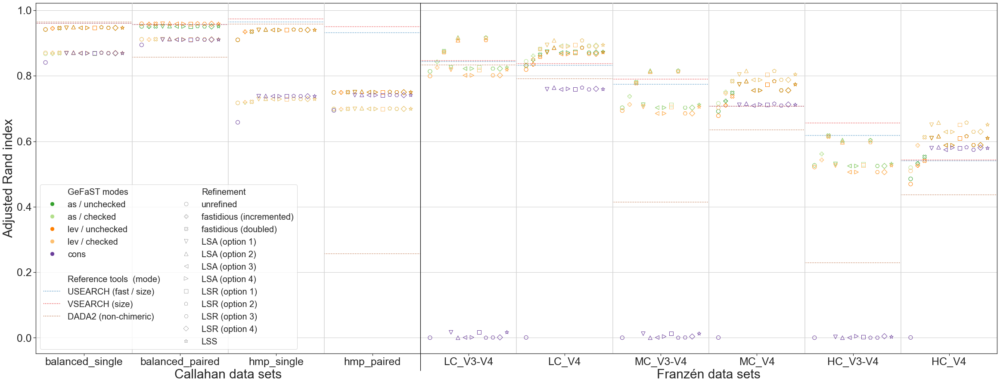

In [6]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_max_avg, df_callahan_uvsearch_joined_max_avg, df_callahan_dada2_joined_max_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_max_avg, df_franzen_uvsearch_joined_max_avg, df_franzen_dada2_joined_max_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'adjrandindex')

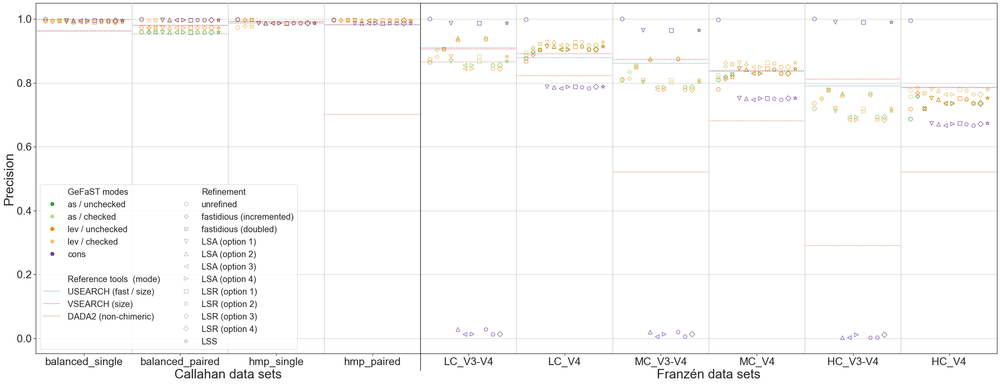

In [7]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_max_avg, df_callahan_uvsearch_joined_max_avg, df_callahan_dada2_joined_max_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_max_avg, df_franzen_uvsearch_joined_max_avg, df_franzen_dada2_joined_max_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'precision')

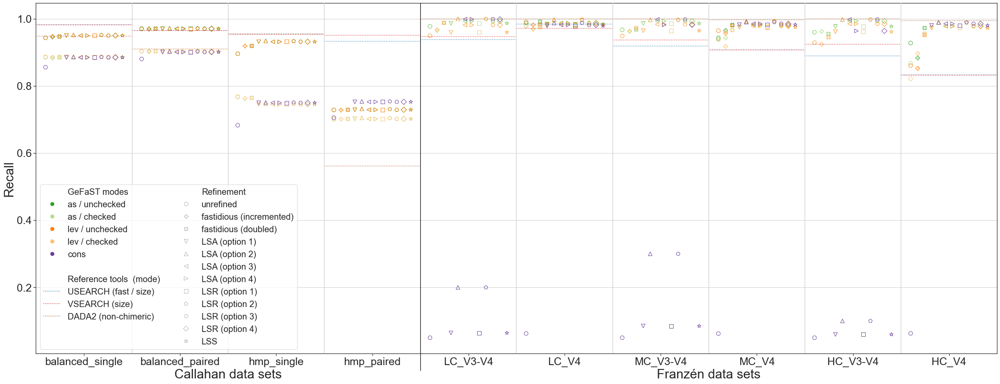

In [8]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_max_avg, df_callahan_uvsearch_joined_max_avg, df_callahan_dada2_joined_max_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_max_avg, df_franzen_uvsearch_joined_max_avg, df_franzen_dada2_joined_max_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'recall')

**Average clustering quality**

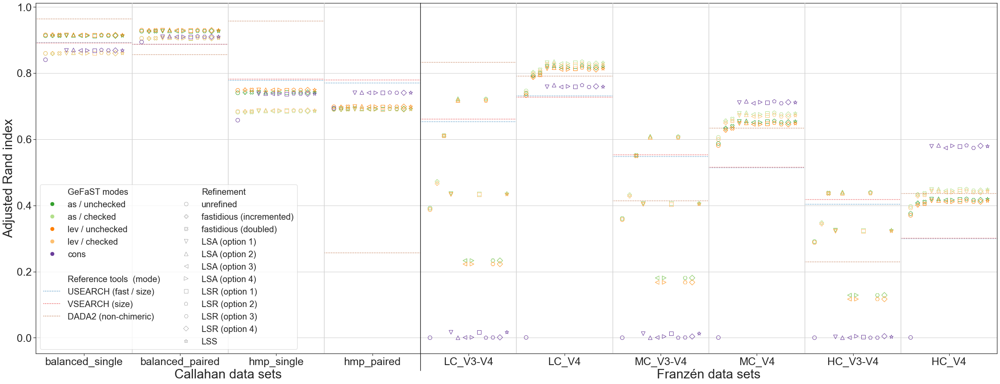

In [9]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_mean_avg, df_callahan_uvsearch_joined_mean_avg, df_callahan_dada2_joined_mean_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_mean_avg, df_franzen_uvsearch_joined_mean_avg, df_franzen_dada2_joined_mean_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'adjrandindex')

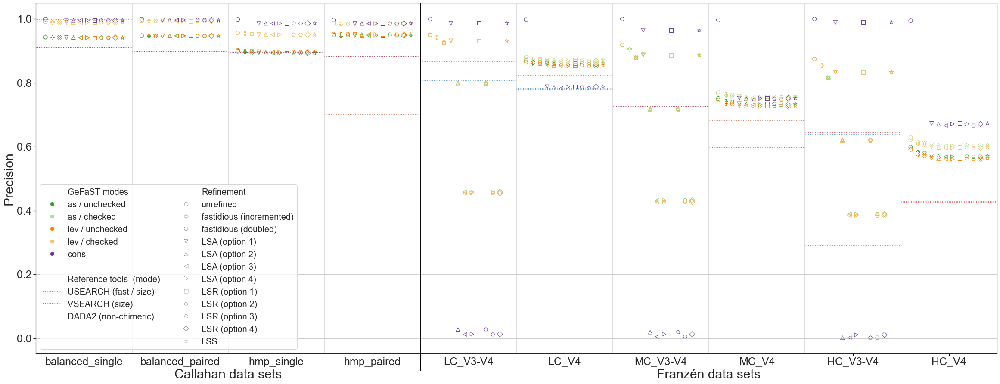

In [10]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_mean_avg, df_callahan_uvsearch_joined_mean_avg, df_callahan_dada2_joined_mean_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_mean_avg, df_franzen_uvsearch_joined_mean_avg, df_franzen_dada2_joined_mean_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'precision')

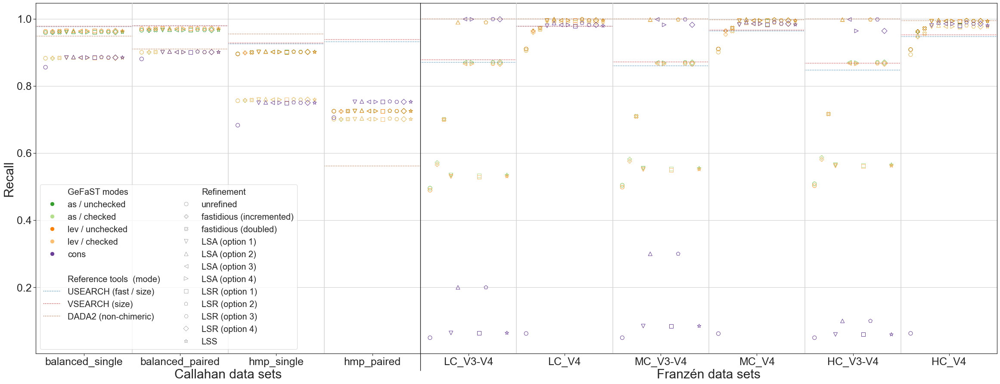

In [11]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_mean_avg, df_callahan_uvsearch_joined_mean_avg, df_callahan_dada2_joined_mean_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_mean_avg, df_franzen_uvsearch_joined_mean_avg, df_franzen_dada2_joined_mean_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'recall')

**N-best average clustering quality**

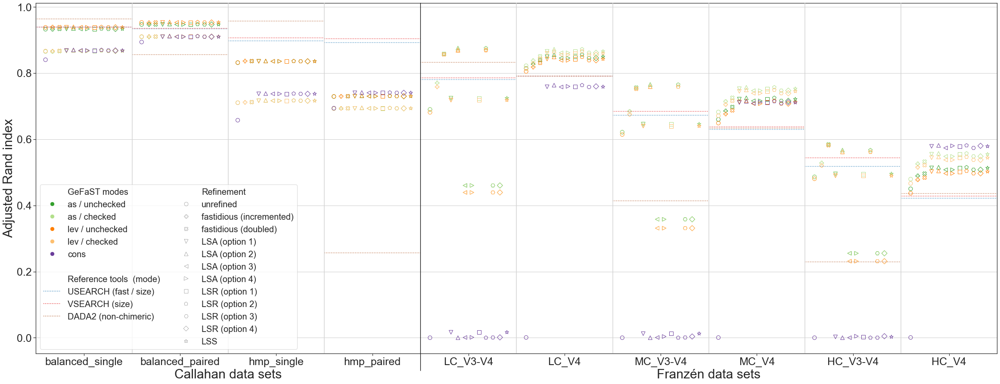

In [12]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_nbest_avg, df_callahan_uvsearch_joined_nbest_avg, df_callahan_dada2_joined_nbest_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, df_franzen_uvsearch_joined_nbest_avg, df_franzen_dada2_joined_nbest_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'adjrandindex')

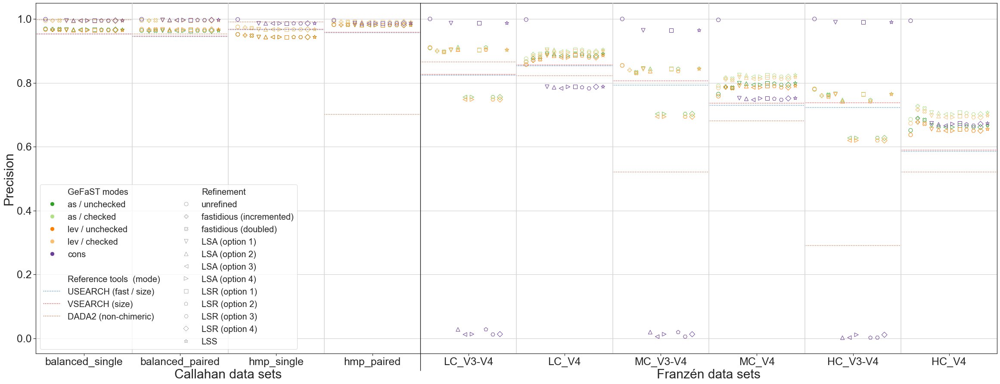

In [13]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_nbest_avg, df_callahan_uvsearch_joined_nbest_avg, df_callahan_dada2_joined_nbest_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, df_franzen_uvsearch_joined_nbest_avg, df_franzen_dada2_joined_nbest_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'precision')

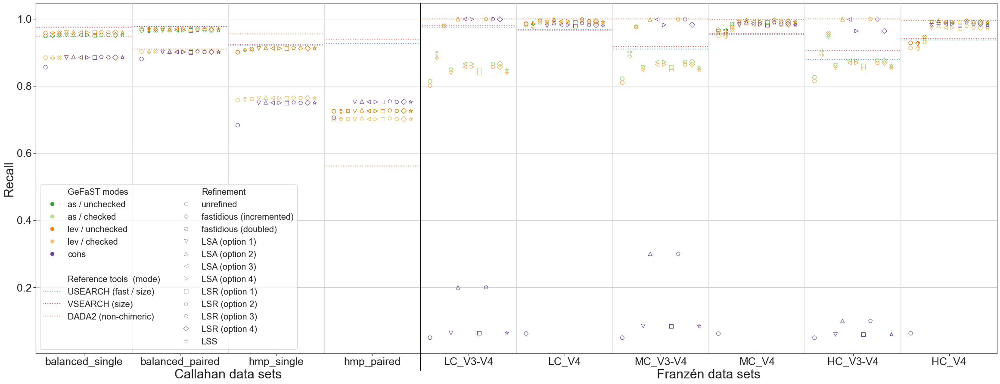

In [14]:
comparative_plot_quality([('Callahan data sets', df_callahan_gefast_joined_nbest_avg, df_callahan_uvsearch_joined_nbest_avg, df_callahan_dada2_joined_nbest_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, df_franzen_uvsearch_joined_nbest_avg, df_franzen_dada2_joined_nbest_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'recall')

## Number of clusters

Comparison of the number of obtained clusters from the different tools / modes / refinement options on the different data sets.
For the Franzén data, the 10 data sets of each combination of complexity (e.g. LC) and region (e.g. V4) were averaged.

Similar to the clustering quality above, considers the number of clusters in three different ways:   
1) *Maximum*: Number of clusters of the respective run (threshold) with the highest ARI on that data set.   
2) *Average*: Average number of clusters over all runs (thresholds) on that data set.   
3) *N-best average*: Average number of clusters over the respective 5 runs (thresholds) with the highest ARI on that data set.

In [15]:
def annotate_outlier(ax, xval, yval, ymax, colour, shape, size,  name, metric, m, f, ds):
    print('OUTLIER: portion = %s, metric = %s, mode = %s, refinement = %s --> data_set = %s, number of clusters = %f' % (name, metric, m, f, ds, yval))
    ax.scatter(xval, ymax * 0.94, color = colour, marker = shape, s = size, facecolors = 'none')
    ax.annotate('',
                xy = (xval, ymax * 0.985), xycoords = 'data',
                xytext = (xval, ymax * 0.95), textcoords = 'data',
                arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3', color = 'black')
               )

def comparative_plot_counts(portions, metric, 
                            gefast_modes = ['as', 'as_dada2-c', 'lev', 'lev_dada2-c', 'dada2-s'], 
                            gefast_refinement = ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'], 
                            usearch_opt = 'fast_size', vsearch_opt = 'size', dada2_opt = 'non-chimeric', 
                            ymax = None, fs = (40, 15), with_leg = True, leg_pos = 1, leg_loc = 'best', plot_file = None):

    ratios = [len(p[1]['data_set'].unique()) if p[4] == 'sorted' else len(p[4]) for p in portions]
    
    colour_palette = sb.color_palette('Paired')
    colours = {'usearch': colour_palette[1], 'vsearch': colour_palette[5], 'dada2': colour_palette[11], 
               'as': colour_palette[3], 'as_dada2-c': colour_palette[2], 'lev': colour_palette[7], 'lev_dada2-c': colour_palette[6],
               'dada2-s': colour_palette[9]
              }
    markers = {'nf': 'o', 'f1' : 'P', '2f': 'X', 'lsa1': 'v', 'lsa2': '^', 'lsa3': '<', 'lsa4': '>', 'lsr1': 's', 'lsr2': 'p', 'lsr3': 'H', 'lsr4': 'D', 'lss': '*'}
    marker_size = 80
    width = 0.8
    
    label_map = {'num_clusters': 'Number of clusters', 
                 'fast_size': 'fast / size', 'size': 'size', 'chimeric': 'chimeric', 'non-chimeric': 'non-chimeric',
                 'as': 'as / unchecked', 'as_dada2-c': 'as / checked', 'lev': 'lev / unchecked', 'lev_dada2-c': 'lev / checked', 'dada2-s': 'cons', 
                 'nf': 'unrefined', 'f1': 'fastidious (incremented)', '2f': 'fastidious (doubled)', 
                 'lsa1': 'LSA (option 1)', 'lsa2': 'LSA (option 2)', 'lsa3': 'LSA (option 3)', 'lsa4': 'LSA (option 4)', 
                 'lsr1': 'LSR (option 1)', 'lsr2': 'LSR (option 2)', 'lsr3': 'LSR (option 3)', 'lsr4': 'LSR (option 4)', 'lss': 'LSS'}
    xticklabel_size = 25
    yticklabel_size = 25
    xlabel_size = 30
    ylabel_size = 30
    leg_size = 20
    
    
    sb.set_style('white')
    fig, axes = plt.subplots(nrows = 1, ncols = len(portions), figsize = fs, sharey = True, gridspec_kw = {'width_ratios' : ratios})
    
    legend_markers = []
    legend_labels = []

    # Modes (colours)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('GeFaST modes')
    
    for m in gefast_modes:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = colours[m], marker = markers['nf'], markerfacecolor = colours[m], mew = 0.3, linestyle = ''))
        legend_labels.append(label_map[m]) 
        
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('')
        
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Reference tools  (mode)')
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['usearch'], mew = 0.3, linestyle = ':'))
    legend_labels.append('USEARCH (%s)' % label_map[usearch_opt])
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['vsearch'], mew = 0.3, linestyle = ':'))
    legend_labels.append('VSEARCH (%s)' % label_map[vsearch_opt])
    
    legend_markers.append(plt.Line2D([0,0],[1,0], marker = '', color = colours['dada2'], mew = 0.3, linestyle = ':'))
    legend_labels.append('DADA2 (%s)' % label_map[dada2_opt]) 
        
    for d in range(0, len(gefast_refinement) - len(gefast_modes) - 5):
        legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
        legend_labels.append('')
    
    # Refinement option (shape)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Refinement')
    
    for f in gefast_refinement:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = 'black', marker = markers[f], markerfacecolor = 'none', mew = 0.3, linestyle = ''))
        legend_labels.append(label_map[f]) 
    
    
    
    for i, (name, dfg, dfuv, dfd, data) in enumerate(portions):
        ax = axes if (len(portions) == 1) else axes[i]
        
        df_gefast = dfg.loc[dfg['mode'].isin(gefast_modes) & dfg['refinement'].isin(gefast_refinement)]
        df_usearch = dfuv.loc[(dfuv['tool'] == 'usearch') & (dfuv['mode'] == usearch_opt)]
        df_vsearch = dfuv.loc[(dfuv['tool'] == 'vsearch') & (dfuv['mode'] == vsearch_opt)]
        df_dada2 = dfd.loc[dfd['mode'] == dada2_opt]
        
        data_sets = sorted(df_gefast['data_set'].unique()) if data == 'sorted' else data
        
        xtick_labels = data_sets
        xticks = range(0, len(xtick_labels))
        xlabel = name
        
        for pos, ds in enumerate(data_sets):
            grp_gefast = df_gefast.loc[df_gefast['data_set'] == ds]
            grp_usearch = df_usearch.loc[df_usearch['data_set'] == ds]
            grp_vsearch = df_vsearch.loc[df_vsearch['data_set'] == ds]
            grp_dada2 = df_dada2.loc[df_dada2['data_set'] == ds]

            # plot USEARCH
            for value in grp_usearch[metric]:
                if ymax is None or value <= ymax:
                    ax.hlines(y = value, xmin = pos - 0.5, xmax = pos + 0.5, color = colours['usearch'], linestyle = ':', alpha = 0.9)
                else:
                    annotate_outlier(ax, pos - 0.1, value, ymax, colours['usearch'], markers['nf'], marker_size, name, metric, usearch_opt, 'nf', ds)

            # plot VSEARCH
            for value in grp_vsearch[metric]:
                if ymax is None or value <= ymax:
                    ax.hlines(y = value, xmin = pos - 0.5, xmax = pos + 0.5, color = colours['vsearch'], linestyle = ':', alpha = 0.9)
                else:
                    annotate_outlier(ax, pos + 0.1, value, ymax, colours['vsearch'], markers['nf'], marker_size, name, metric, vsearch_opt, 'nf', ds)

            # plot DADA2
            for value in grp_dada2[metric]:
                if ymax is None or value <= ymax:
                    ax.hlines(y = value, xmin = pos - 0.5, xmax = pos + 0.5, color = colours['dada2'], linestyle = ':', alpha = 0.9)
                else:
                    annotate_outlier(ax, pos, value, ymax, colours['dada2'], markers['nf'], marker_size, name, metric, dada2_opt, 'nf', ds)

            # plot GeFaST
            step = width / (len(gefast_refinement) - 1)
            for m in gefast_modes:
                grp = grp_gefast.loc[grp_gefast['mode'] == m]
                for q, f in enumerate(gefast_refinement):
                    subgrp = grp.loc[grp['refinement'] == f]
                    for value in subgrp[metric]:
                        if ymax is None or value <= ymax:
                            ax.scatter(pos - width / 2 + q * step, value, color = colours[m], marker = markers[f], s = marker_size, facecolors = 'none', label = 'GeFaST (%s, %s)' % (m, f))
                        else:
                            annotate_outlier(ax, pos - width / 2 + q * step, value, ymax, colours[m], markers[f], marker_size, name, metric, m, f, ds)
    
        ax.set_xlim(-0.5, len(data_sets) - 0.5)
        
        ax.set_xticks([-0.5], minor = False)
        ax.set_xticklabels([''], minor = False)
        ax.tick_params(axis = 'x', which = 'major', direction = 'out', length = 40, color = 'black' if i > 0 else 'white', pad = -15)
        
        ax.set_xticks(xticks, minor = True)
        ax.set_xticklabels(xtick_labels, fontsize = xticklabel_size, minor = True)
        ax.tick_params(axis = 'x', which = 'minor', direction = 'out', length = 5, color = 'black')
        
        ax.tick_params(axis = 'y', which = 'major', labelsize = yticklabel_size)
        
        ax.tick_params(which = 'major', left = (i == 0))
        ax.tick_params(which = 'both', bottom = True)
        
        ax.grid(True)
        
        ax.set_xlabel(xlabel, fontsize = xlabel_size)
        if i == 0:
            ax.set_ylabel(label_map[metric], fontsize = ylabel_size)
        
        
        for pos in range(0, len(data_sets) - 1):
            ax.axvline(pos + 0.5, color = 'lightgray', zorder = 3)
        if i > 0:
            ax.axvline(-0.5, color = 'black', zorder = 3)
            
        
    plt.subplots_adjust(wspace = 0)
    
    if with_leg:
        axes[leg_pos].legend(legend_markers, legend_labels, fontsize = leg_size, markerscale = 1.5, ncol = 2, loc = leg_loc)

    if plot_file is not None:
        plt.savefig(plot_file, format = 'pdf', dpi = 1200, bbox_inches = 'tight')

**Maximum clustering quality**

OUTLIER: portion = Callahan data sets, metric = num_clusters, mode = dada2-s, refinement = nf --> data_set = hmp_single, number of clusters = 63163.000000


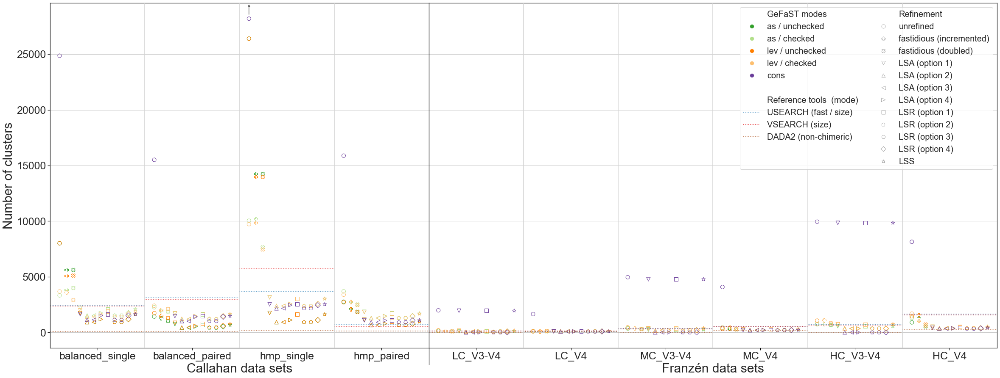

In [16]:
comparative_plot_counts([('Callahan data sets', df_callahan_gefast_joined_max_avg, df_callahan_uvsearch_joined_max_avg, df_callahan_dada2_joined_max_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_max_avg, df_franzen_uvsearch_joined_max_avg, df_franzen_dada2_joined_max_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'num_clusters', ymax = 30000)

**Average clustering quality**

OUTLIER: portion = Callahan data sets, metric = num_clusters, mode = dada2-s, refinement = nf --> data_set = hmp_single, number of clusters = 63163.000000


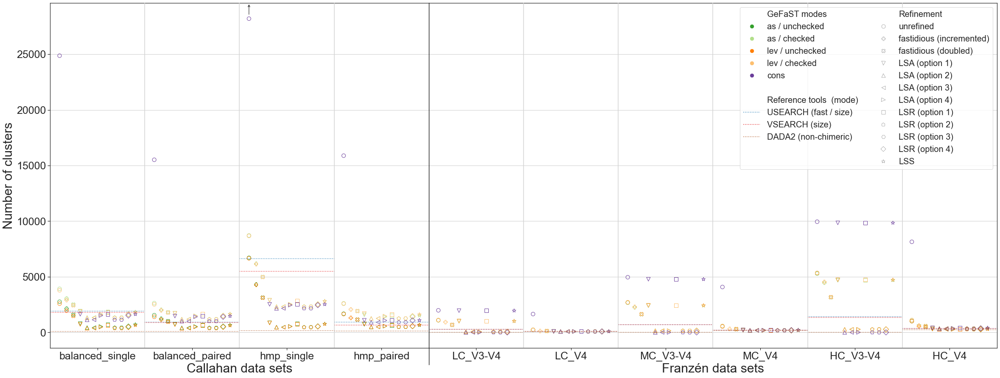

In [17]:
comparative_plot_counts([('Callahan data sets', df_callahan_gefast_joined_mean_avg, df_callahan_uvsearch_joined_mean_avg, df_callahan_dada2_joined_mean_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_mean_avg, df_franzen_uvsearch_joined_mean_avg, df_franzen_dada2_joined_mean_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'num_clusters', ymax = 30000)

**N-best average clustering quality**

OUTLIER: portion = Callahan data sets, metric = num_clusters, mode = dada2-s, refinement = nf --> data_set = hmp_single, number of clusters = 63163.000000


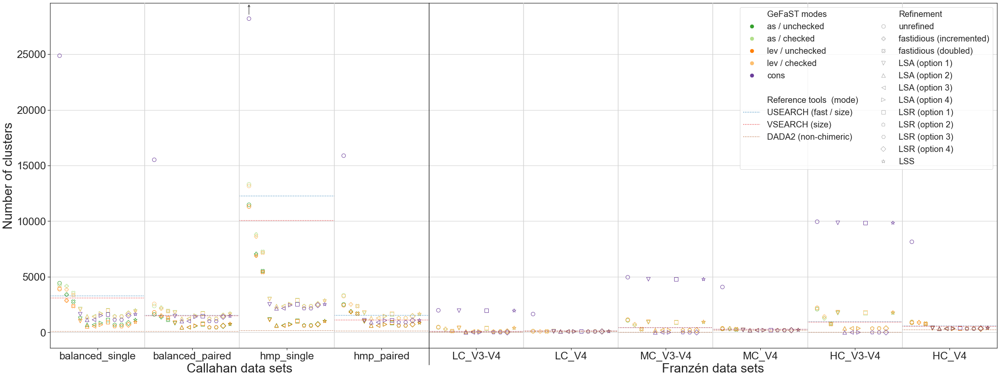

In [18]:
comparative_plot_counts([('Callahan data sets', df_callahan_gefast_joined_nbest_avg, df_callahan_uvsearch_joined_nbest_avg, df_callahan_dada2_joined_nbest_avg, ['balanced_single', 'balanced_paired', 'hmp_single', 'hmp_paired']), 
                          ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, df_franzen_uvsearch_joined_nbest_avg, df_franzen_dada2_joined_nbest_avg, ['LC_V3-V4', 'LC_V4', 'MC_V3-V4', 'MC_V4', 'HC_V3-V4', 'HC_V4'])], 
                         'num_clusters', ymax = 30000)

## Closer look at the relation between the number of clusters and the clustering quality (for GeFaST)

The plots show the effect of (checked) clustering and refinement on the number of clusters (x axis, as ratio: (compared variant) / (reference variant)) and the clustering quality (y axis, as difference: (compared variant) - (reference variant)).   
The reference is the unrefined variant of the respective mode and has the coordinates (1,0). This position is indicated by the cross of the bold grey lines.

Ideally, the compared variants are positioned in the upper-left quadrant (corresponding to a better clustering quality and a lower number of clusters).

In [19]:
def compare_clusters_quality_all(portions, ref, cmp, metrics = ['precision', 'recall', 'adjrandindex'], xmax = None, fs = (30, 20), with_leg = False, 
                                 leg_pos = (0, 0), leg_loc = 'best', plot_file = None):

    ref_tool, ref_mode, ref_refinement = ref
        
    colour_palette = sb.color_palette('Paired')
    colours = {'usearch': colour_palette[1], 'vsearch': colour_palette[5], 'dada2': colour_palette[11], 
               'as': colour_palette[3], 'as_dada2-c': colour_palette[2], 'lev': colour_palette[7], 'lev_dada2-c': colour_palette[6],
               'dada2-s': colour_palette[9]
              }
    markers = {'nf': 'o', 'f1' : 'P', '2f': 'X', 'lsa1': 'v', 'lsa2': '^', 'lsa3': '<', 'lsa4': '>', 'lsr1': 's', 'lsr2': 'p', 'lsr3': 'H', 'lsr4': 'D', 'lss': '*'}
    marker_size = 120
    width = 0.7
    
    label_map = {'precision': 'Precision', 'recall': 'Recall', 'adjrandindex': 'Adjusted Rand index', 
                 'fast_size': 'fast / size', 'size': 'size', 'chimeric': 'chimeric', 'non-chimeric': 'non-chimeric',
                 'as': 'as', 'as_dada2-c': 'as / checked', 'lev': 'lev', 'lev_dada2-c': 'lev / checked', 'dada2-s': 'cons', 
                 'nf': 'unrefined', 'f1': 'fastidious (incremented)', '2f': 'fastidious (doubled)', 
                 'lsa1': 'LSA (option 1)', 'lsa2': 'LSA (option 2)', 'lsa3': 'LSA (option 3)', 'lsa4': 'LSA (option 4)', 
                 'lsr1': 'LSR (option 1)', 'lsr2': 'LSR (option 2)', 'lsr3': 'LSR (option 3)', 'lsr4': 'LSR (option 4)', 'lss': 'LSS'}
    xticklabel_size = 15
    yticklabel_size = 15
    xlabel_size = 20
    ylabel_size = 20
    
    
    sb.set_style('white')
    fig, axes = plt.subplots(nrows = len(portions), ncols = len(metrics), figsize = fs, sharey = False)
    
    legend_markers = []
    legend_labels = []
    
    # Modes (colours)
    mode_list = [m for m, f_list in cmp]
    refinement_set = set()
    for _, f_list in cmp:                
        for f in f_list:
            refinement_set.add(f)
    
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Tool  (mode)')
    
    for m in mode_list:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = colours[m], marker = markers['nf'], markerfacecolor = colours[m], mew = 0.3, linestyle = ''))
        legend_labels.append('GeFaST (%s)' % label_map[m]) 
        
    for d in range(0, len(refinement_set) - len(mode_list)):
        legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
        legend_labels.append('')
    
    # Refinement option (shape)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Refinement')
    
    for f in ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']:
        if f in refinement_set:
            legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = 'black', marker = markers[f], markerfacecolor = 'none', mew = 0.3, linestyle = ''))
            legend_labels.append(label_map[f]) 
    
    for i, (name, df_joined, gt) in enumerate(portions):
        for j, metric in enumerate(metrics):
            
            if len(portions) > 1 and len(metrics) > 1:
                ax = axes[i][j]
            elif len(portions) > 1:
                ax = axes[i]
            elif len(metrics) > 1:
                ax = axes[j]
            else:
                ax = axes
                
            if xmax is not None:
                ax.set_xlim(right = xmax)
                    
            df_ref = df_joined.loc[(df_joined['tool'] == ref_tool) & (df_joined['gt'] == gt) & (df_joined['mode'] == ref_mode) & (df_joined['refinement'] == ref_refinement)]
            
            for m, f_list in cmp:
                for f in f_list:
                    df_cmp = df_joined.loc[(df_joined['tool'] == ref_tool) & (df_joined['gt'] == gt) & (df_joined['mode'] == m) & (df_joined['refinement'] == f)]
                    
                    cluster_ratio = (df_cmp.reset_index()['num_clusters'] / df_ref.reset_index()['num_clusters']).mean()
                    quality_diff = (df_cmp.reset_index()[metric] - df_ref.reset_index()[metric]).mean()
                    
                    if xmax is None or cluster_ratio <= xmax:
                        ax.scatter(cluster_ratio, quality_diff, color = colours[m], marker = markers[f], s = marker_size, facecolors = 'none', alpha = 0.6, label = 'GeFaST (%s, %s)' % (m, f))
                    else:
                        print('OUTLIER: portion = %s, metric = %s, mode = %s, refinement = %s --> cluster_ratio = %f, quality_diff = %f' % (name, metric, m, f, cluster_ratio, quality_diff))
                        ax.scatter(xmax * 0.93, quality_diff, color = colours[m], marker = markers[f], s = marker_size, facecolors = 'none', alpha = 0.6, label = 'GeFaST (%s, %s)' % (m, f))
                        ax.annotate('',
                                    xy = (xmax, quality_diff), xycoords = 'data',
                                    xytext = (xmax * 0.95, quality_diff), textcoords = 'data',
                                    arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3', color = 'black')
                                   )
                    
                    
            ax.grid(True)

            ax.set_xlabel('Cluster ratio', fontsize = xlabel_size)
            if j == 0:
                ax.set_ylabel('%s\n\n%s difference' % (name, label_map[metric]), fontsize = ylabel_size)
            else:
                ax.set_ylabel('%s difference' % label_map[metric], fontsize = ylabel_size)

            ax.axvline(1.0, color = 'gray', zorder = 3)
            ax.axhline(0.0, color = 'gray', zorder = 3)
        
            ax.tick_params(axis = 'x', which = 'major', labelsize = xticklabel_size)
            ax.tick_params(axis = 'y', which = 'major', labelsize = yticklabel_size)
            ax.tick_params(which = 'major', left = True, bottom = True)
            
            if with_leg and (i == leg_pos[0]) and (j == leg_pos[1]):
                ax.legend(legend_markers, legend_labels, fontsize = 10, markerscale = 1.5, ncol = 2, loc = leg_loc)
            
        
    plt.subplots_adjust(wspace = 0.2)    

    if plot_file is not None:
        plt.savefig(plot_file, format = 'pdf', dpi = 1200, bbox_inches = 'tight')

**Maximum clustering quality**

Here, the ratios and difference for each compared variant are averaged over the values for the best run per data sets in a portion (each entry in the `dfs_param` list describes such a portion).

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 5.529134, quality_diff = 0.011854
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 5.529134, quality_diff = -0.103518
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 5.529134, quality_diff = -0.115985
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 12.744000, quality_diff = 0.204326
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 7.246749, quality_diff = 0.065002
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 7.246749, quality_diff = 0.065002
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lss --> cluster_ratio = 7.246749, quali

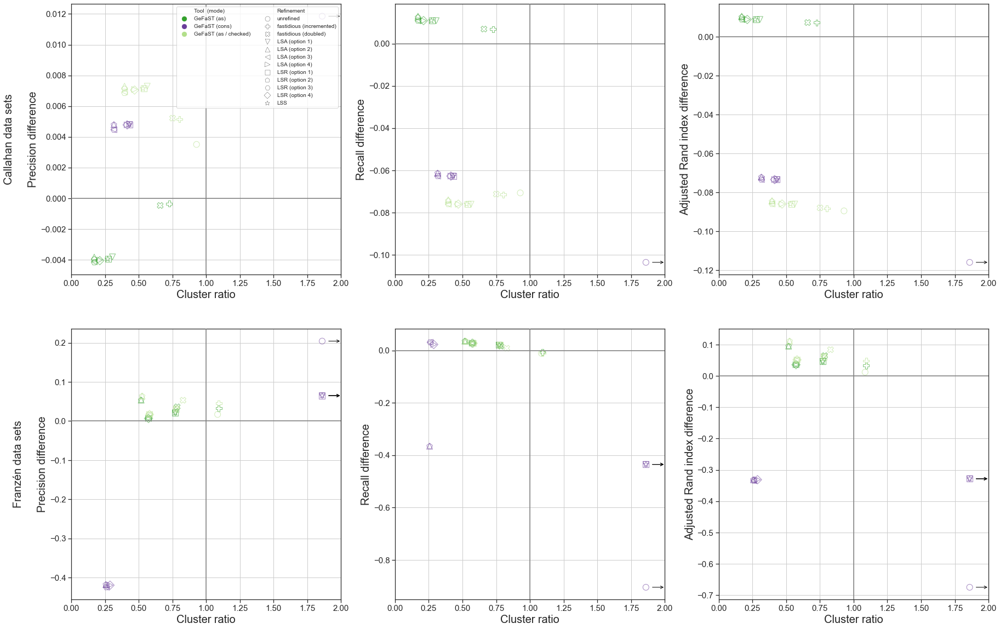

In [20]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_max_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_max_avg, 'franzen')]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 6.985233, quality_diff = 0.023096
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 6.985233, quality_diff = -0.089074
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 6.985233, quality_diff = -0.078604
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 4.073035, quality_diff = 0.000612
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 4.073035, quality_diff = -0.117963
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.073035, quality_diff = -0.153366
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode = 

OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 14.177467, quality_diff = -0.680766
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 13.885583, quality_diff = -0.670359
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 13.885583, quality_diff = -0.670359
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 13.885583, quality_diff = -0.670359
OUTLIER: portion = Franzén (V4) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 11.310533, quality_diff = 0.205803
OUTLIER: portion = Franzén (V4) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 11.310533, quality_diff = -0.889924
OUTLIER: portion = Franzén (V4) data sets, metric = adjrandindex, mod

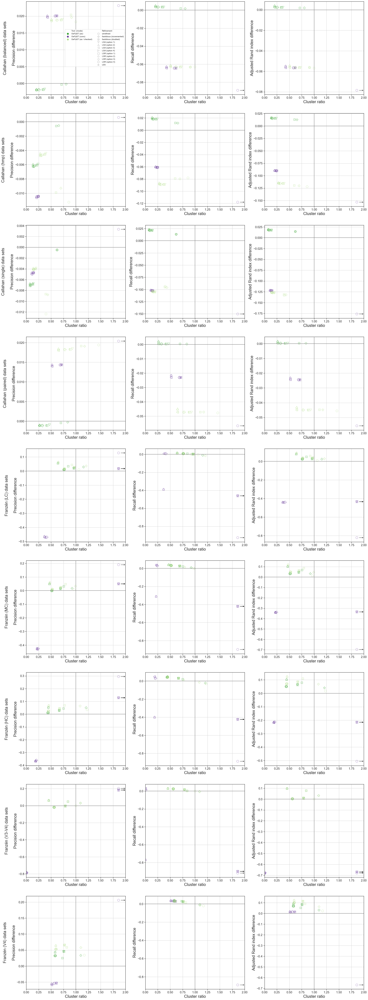

In [21]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 5.076062, quality_diff = 0.008411
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 5.076062, quality_diff = -0.103165
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 5.076062, quality_diff = -0.118022
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 10.967104, quality_diff = 0.201112
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 5.410042, quality_diff = 0.061788
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 5.410042, quality_diff = 0.061788
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lss --> cluster_ratio = 5.410042, quali

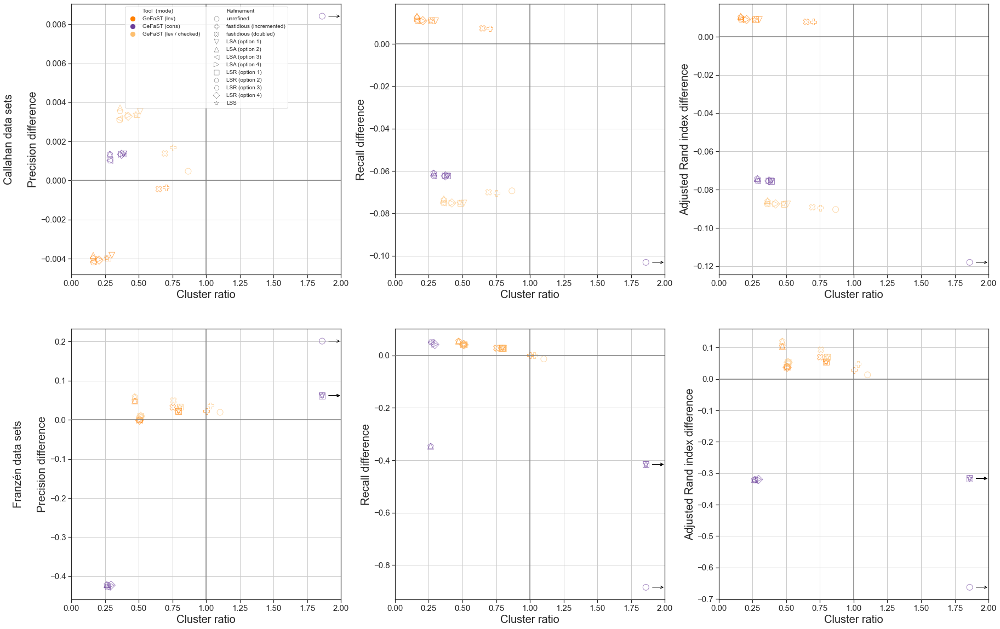

In [22]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_max_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_max_avg, 'franzen')]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 6.023867, quality_diff = 0.016192
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 6.023867, quality_diff = -0.088344
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 6.023867, quality_diff = -0.082648
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 4.128257, quality_diff = 0.000631
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 4.128257, quality_diff = -0.117987
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.128257, quality_diff = -0.153396
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode = 

OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 10.418571, quality_diff = -0.671375
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 10.196773, quality_diff = -0.660967
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 10.196773, quality_diff = -0.660967
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 10.196773, quality_diff = -0.660967
OUTLIER: portion = Franzén (V4) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 11.515637, quality_diff = 0.208645
OUTLIER: portion = Franzén (V4) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 11.515637, quality_diff = -0.876597
OUTLIER: portion = Franzén (V4) data sets, metric = adjrandindex, mod

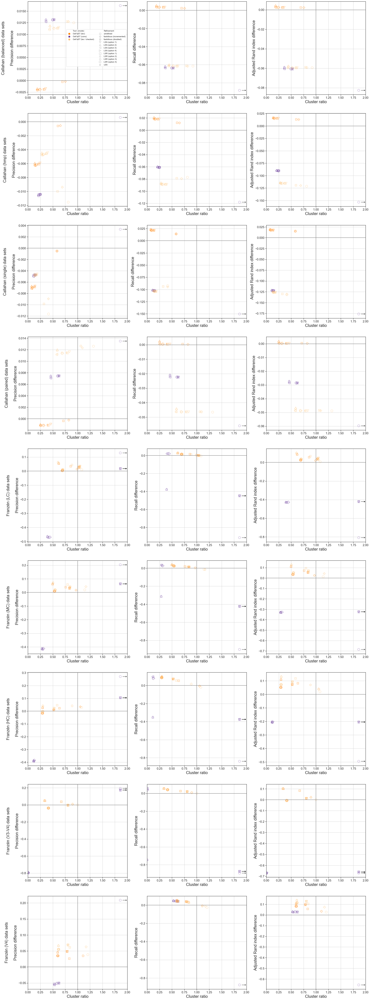

In [23]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_max_avg.loc[df_callahan_gefast_joined_max_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_max_avg.loc[df_franzen_gefast_joined_max_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

**Average clustering quality**

Here, the ratios and difference for each compared variant are averaged over the average values over the runs per data sets in a portion (each entry in the `dfs_param` list describes such a portion).

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 9.478065, quality_diff = 0.063414
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 9.478065, quality_diff = -0.105170
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 9.478065, quality_diff = -0.046497
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 4.683428, quality_diff = 0.171192
OUTLIER: portion = Franzén data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 4.683428, quality_diff = -0.650076
OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.683428, quality_diff = -0.457159


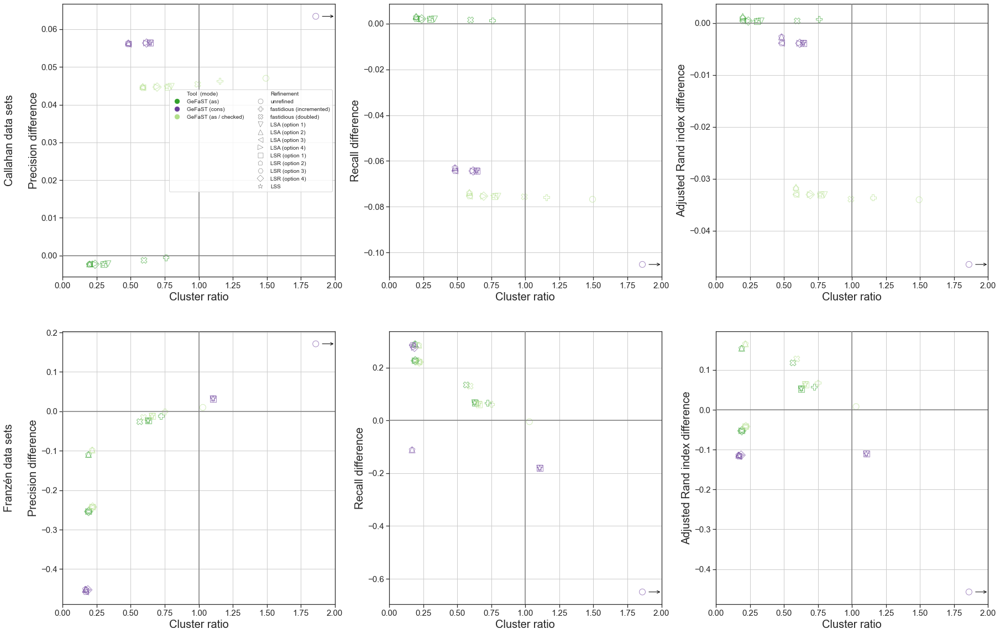

In [24]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_mean_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_mean_avg, 'franzen')]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 9.517450, quality_diff = 0.053093
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 9.517450, quality_diff = -0.094369
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 9.517450, quality_diff = -0.052609
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 9.438681, quality_diff = 0.073736
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 9.438681, quality_diff = -0.115970
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 9.438681, quality_diff = -0.040384
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode = 

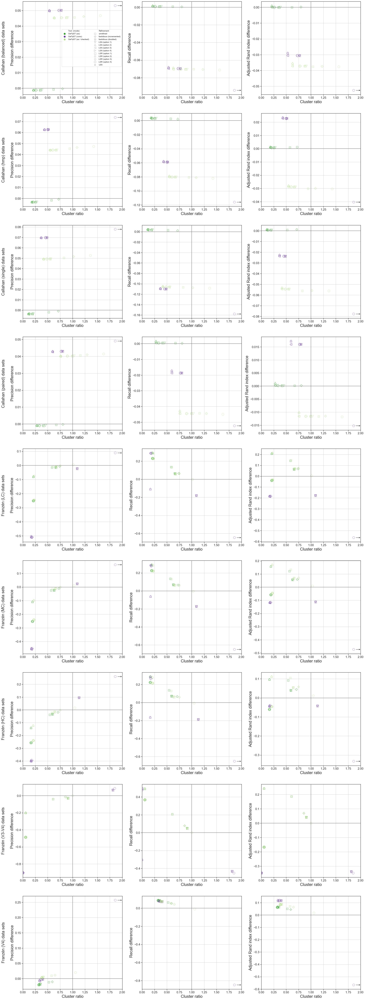

In [25]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 9.944168, quality_diff = 0.062190
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 9.944168, quality_diff = -0.107161
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 9.944168, quality_diff = -0.051436
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 4.691455, quality_diff = 0.174142
OUTLIER: portion = Franzén data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 4.691455, quality_diff = -0.647255
OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.691455, quality_diff = -0.452560


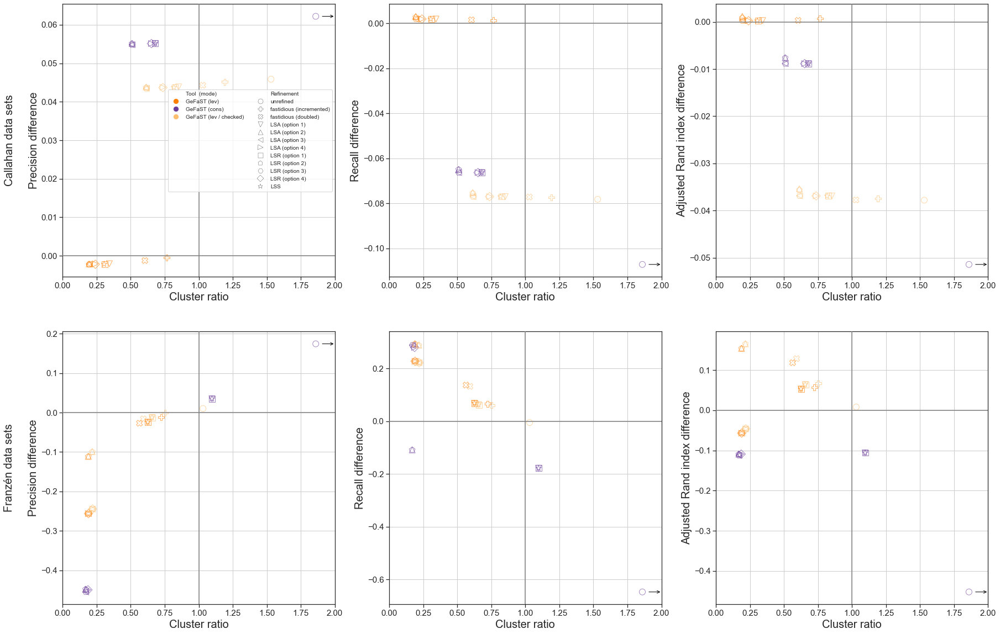

In [26]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_mean_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_mean_avg, 'franzen')]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 10.337829, quality_diff = 0.054358
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 10.337829, quality_diff = -0.098613
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 10.337829, quality_diff = -0.055533
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 9.550507, quality_diff = 0.070023
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 9.550507, quality_diff = -0.115709
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 9.550507, quality_diff = -0.047338
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode

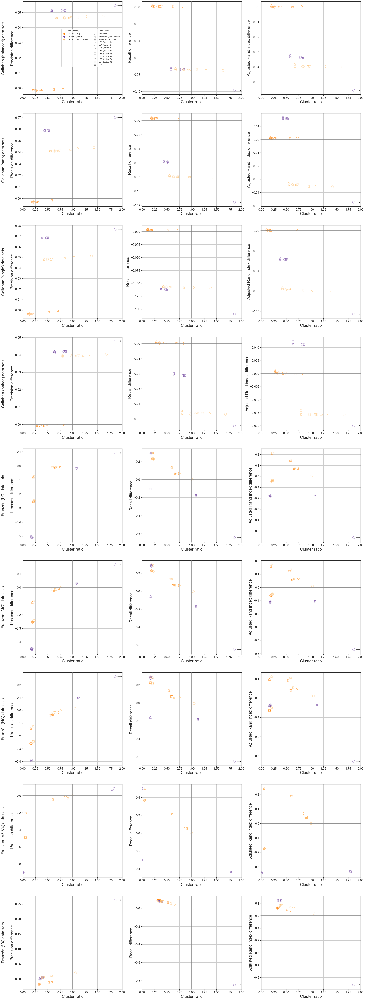

In [27]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_mean_avg.loc[df_callahan_gefast_joined_mean_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_mean_avg.loc[df_franzen_gefast_joined_mean_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

**N-best average clustering quality**

Here, the ratios and difference for each compared variant are averaged over the values for the best 5 runs (w.r.t. ARI) per data sets in a portion (each entry in the `dfs_param` list describes such a portion).

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 6.748001, quality_diff = 0.031587
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 6.748001, quality_diff = -0.103699
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 6.748001, quality_diff = -0.088684
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 8.466712, quality_diff = 0.194153
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 2.560918, quality_diff = 0.054829
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 2.560918, quality_diff = 0.054829
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lss --> cluster_ratio = 2.560918, qualit

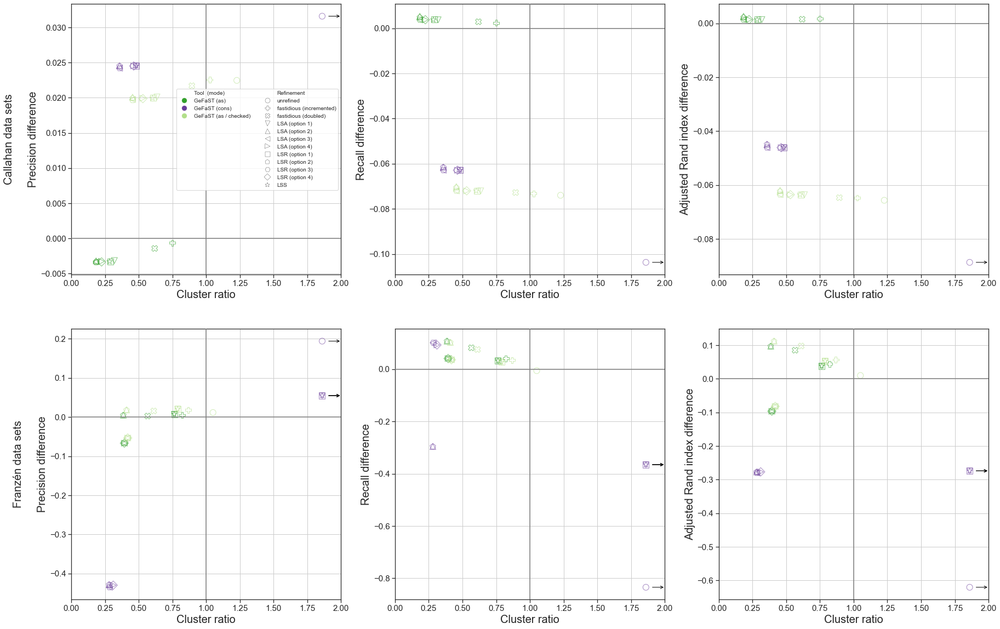

In [28]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_nbest_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, 'franzen')]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 7.587651, quality_diff = 0.032778
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 7.587651, quality_diff = -0.089154
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 7.587651, quality_diff = -0.072731
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 5.908352, quality_diff = 0.030395
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 5.908352, quality_diff = -0.118244
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 5.908352, quality_diff = -0.104638
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode = 

OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.551099, quality_diff = -0.599456
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 4.457182, quality_diff = -0.589048
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 4.457182, quality_diff = -0.589048
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 4.457182, quality_diff = -0.589048
OUTLIER: portion = Franzén (V4) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 12.382326, quality_diff = 0.235887
OUTLIER: portion = Franzén (V4) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 12.382326, quality_diff = -0.897901
OUTLIER: portion = Franzén (V4) data sets, metric = adjrandindex, mode = 

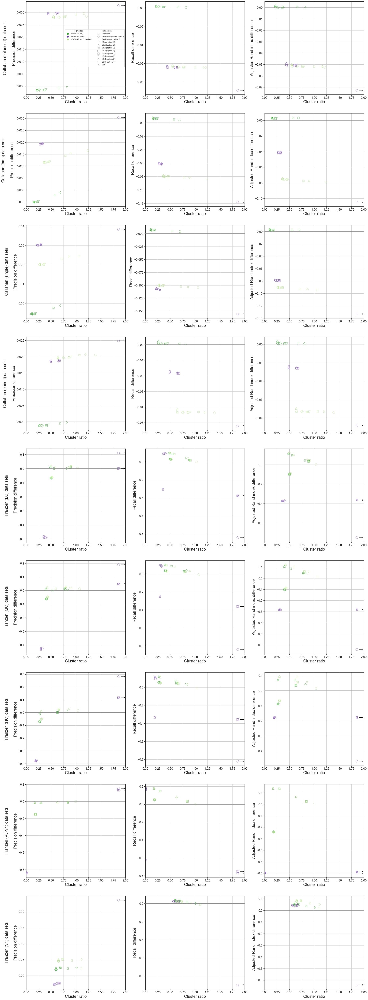

In [29]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'as', 'nf')
cmp_param =  [('as', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

OUTLIER: portion = Callahan data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 6.768672, quality_diff = 0.031275
OUTLIER: portion = Callahan data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 6.768672, quality_diff = -0.107026
OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 6.768672, quality_diff = -0.091724
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 8.335347, quality_diff = 0.198483
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 2.448346, quality_diff = 0.059160
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 2.448346, quality_diff = 0.059160
OUTLIER: portion = Franzén data sets, metric = precision, mode = dada2-s, refinement = lss --> cluster_ratio = 2.448346, qualit

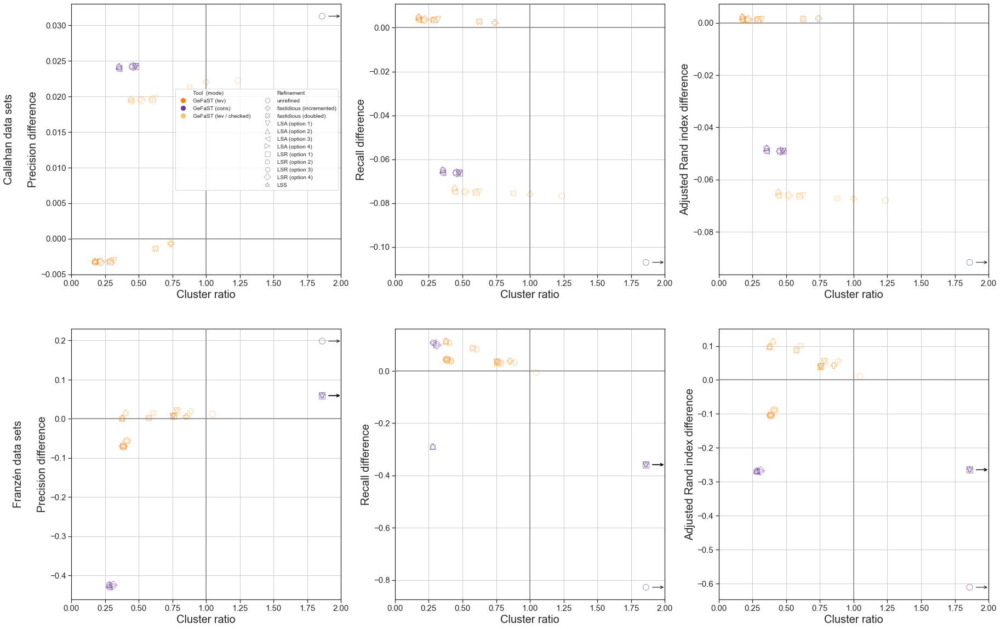

In [30]:
dfs_param = [('Callahan data sets', df_callahan_gefast_joined_nbest_avg, 'callahan'), 
             ('Franzén data sets', df_franzen_gefast_joined_nbest_avg, 'franzen')]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (balanced) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 7.496177, quality_diff = 0.032009
OUTLIER: portion = Callahan (balanced) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 7.496177, quality_diff = -0.095385
OUTLIER: portion = Callahan (balanced) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 7.496177, quality_diff = -0.078526
OUTLIER: portion = Callahan (hmp) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 6.041167, quality_diff = 0.030541
OUTLIER: portion = Callahan (hmp) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 6.041167, quality_diff = -0.118667
OUTLIER: portion = Callahan (hmp) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 6.041167, quality_diff = -0.104922
OUTLIER: portion = Callahan (single) data sets, metric = precision, mode = 

OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 4.322885, quality_diff = -0.592337
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 4.233648, quality_diff = -0.581930
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 4.233648, quality_diff = -0.581930
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 4.233648, quality_diff = -0.581930
OUTLIER: portion = Franzén (V4) data sets, metric = precision, mode = dada2-s, refinement = nf --> cluster_ratio = 12.347809, quality_diff = 0.245786
OUTLIER: portion = Franzén (V4) data sets, metric = recall, mode = dada2-s, refinement = nf --> cluster_ratio = 12.347809, quality_diff = -0.896908
OUTLIER: portion = Franzén (V4) data sets, metric = adjrandindex, mode = 

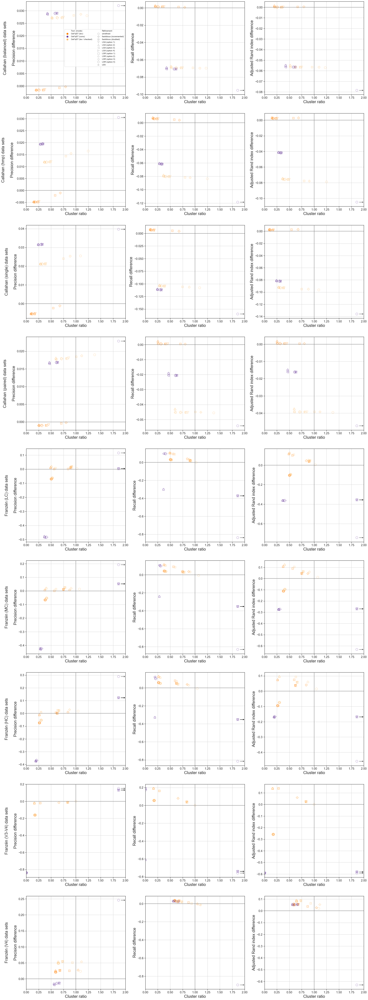

In [31]:
dfs_param = [('Callahan (balanced) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['ds'] == 'balanced'], 'callahan'), 
             ('Callahan (hmp) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['ds'] == 'hmp'], 'callahan'),
             ('Callahan (single) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['rt'] == 'single'], 'callahan'),
             ('Callahan (paired) data sets', df_callahan_gefast_joined_nbest_avg.loc[df_callahan_gefast_joined_nbest_avg['rt'] == 'paired'], 'callahan'),
             ('Franzén (LC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'LC'], 'franzen'), 
             ('Franzén (MC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'MC'], 'franzen'),
             ('Franzén (HC) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['ds'] == 'HC'], 'franzen'),
             ('Franzén (V3-V4) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['rt'] == 'V3-V4'], 'franzen'),
             ('Franzén (V4) data sets', df_franzen_gefast_joined_nbest_avg.loc[df_franzen_gefast_joined_nbest_avg['rt'] == 'V4'], 'franzen')
            ]
ref_param = ('gefast', 'lev', 'nf')
cmp_param =  [('lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('dada2-s', [ 'nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss'])]

compare_clusters_quality_all(dfs_param, ref_param, cmp_param, xmax = 2.0, with_leg = True, fs = (30,90))

### Comparative look at the relation between the number of clusters and the clustering quality 

Similar plots also containing the other tools.

In [32]:
def compare_clusters_quality_single(portion, ref, cmp, metric = 'adjrandindex', xmax = None, fs = (10, 10), with_leg = False, leg_loc = 'best', plot_file = None):

    ref_df_key, ref_tool, ref_mode, ref_refinement = ref
        
    colour_palette = sb.color_palette('Paired')
    colours = {'fast_size': colour_palette[1], 'size': colour_palette[5], 'non-chimeric': colour_palette[11], 
               'as': colour_palette[3], 'as_dada2-c': colour_palette[2], 'lev': colour_palette[7], 'lev_dada2-c': colour_palette[6],
               'dada2-s': colour_palette[9]
              }
    markers = {'nf': 'o', 'f1' : 'P', '2f': 'X', 'lsa1': 'v', 'lsa2': '^', 'lsa3': '<', 'lsa4': '>', 'lsr1': 's', 'lsr2': 'p', 'lsr3': 'H', 'lsr4': 'D', 'lss': '*'}
    marker_size = 120
    width = 0.7
    
    label_map = {'precision': 'Precision', 'recall': 'Recall', 'adjrandindex': 'Adjusted Rand index', 
                 'gefast': 'GeFaST', 'usearch': 'USEARCH', 'vsearch': 'VSEARCH', 'dada2': 'DADA2',
                 'fast_size': 'fast / size', 'size': 'size', 'chimeric': 'chimeric', 'non-chimeric': 'non-chimeric',
                 'as': 'as / unchecked', 'as_dada2-c': 'as / checked', 'lev': 'lev / unchecked', 'lev_dada2-c': 'lev / checked', 'dada2-s': 'cons', 
                 'nf': 'unrefined', 'f1': 'fastidious (incremented)', '2f': 'fastidious (doubled)', 
                 'lsa1': 'LSA (option 1)', 'lsa2': 'LSA (option 2)', 'lsa3': 'LSA (option 3)', 'lsa4': 'LSA (option 4)', 
                 'lsr1': 'LSR (option 1)', 'lsr2': 'LSR (option 2)', 'lsr3': 'LSR (option 3)', 'lsr4': 'LSR (option 4)', 'lss': 'LSS'}
    title_size = 20
    xticklabel_size = 15
    yticklabel_size = 15
    xlabel_size = 20
    ylabel_size = 20
    
    
    sb.set_style('white')
    fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize =  fs, sharey = False)
    
    legend_markers = []
    legend_labels = []
    
    # Modes (colours)
    mode_list = [(t, m) for _, t, m, f_list in cmp]
    refinement_set = set()
    for _, _, _, f_list in cmp:                
        for f in f_list:
            refinement_set.add(f)
    
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Tool  (mode)')
    
    for t, m in mode_list:
        legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = colours[m], marker = markers['nf'], markerfacecolor = colours[m], mew = 0.3, linestyle = ''))
        legend_labels.append('%s (%s)' % (label_map[t], label_map[m])) 
        
    for d in range(0, len(refinement_set) - len(mode_list)):
        legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
        legend_labels.append('')
    
    # Refinement option (shape)
    legend_markers.append(plt.Line2D([0,0],[0,0], marker = '', mew = 0.3, linestyle = ''))
    legend_labels.append('Refinement')
    
    for f in ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']:
        if f in refinement_set:
            legend_markers.append(plt.Line2D([0,0],[0,0], markeredgecolor = 'black', marker = markers[f], markerfacecolor = 'none', mew = 0.3, linestyle = ''))
            legend_labels.append(label_map[f]) 
    
    name, dfs, gt, cond = portion
    ax = axes

    if xmax is not None:
        ax.set_xlim(right = xmax)

    df_ref = dfs[ref_df_key]
    if cond is not None:
        df_ref = df_ref[df_ref[cond[0]] == cond[1]]
    df_ref = df_ref.loc[(df_ref['tool'] == ref_tool) & (df_ref['gt'] == gt) & (df_ref['mode'] == ref_mode) & (df_ref['refinement'] == ref_refinement)]

    for df_key, cmp_tool, cmp_mode, f_list in cmp:
        df_joined = dfs[df_key]
        if cond is not None:
            df_joined = df_joined[df_joined[cond[0]] == cond[1]]

        for cmp_refinement in f_list:
            df_cmp = df_joined.loc[(df_joined['tool'] == cmp_tool) & (df_joined['gt'] == gt) & (df_joined['mode'] == cmp_mode) & (df_joined['refinement'] == cmp_refinement)]

            cluster_ratio = (df_cmp.reset_index()['num_clusters'] / df_ref.reset_index()['num_clusters']).mean()
            quality_diff = (df_cmp.reset_index()[metric] - df_ref.reset_index()[metric]).mean()

            if xmax is None or cluster_ratio <= xmax:
                ax.scatter(cluster_ratio, quality_diff, color = colours[cmp_mode], marker = markers[cmp_refinement], s = marker_size, facecolors = 'none')
            else:
                print('OUTLIER: portion = %s, metric = %s, mode = %s, refinement = %s --> cluster_ratio = %f, quality_diff = %f' % 
                      (name, metric, cmp_mode, cmp_refinement, cluster_ratio, quality_diff))
                ax.scatter(xmax * 0.93, quality_diff, color = colours[cmp_mode], marker = markers[cmp_refinement], s = marker_size, facecolors = 'none')
                ax.annotate('',
                            xy = (xmax, quality_diff), xycoords = 'data',
                            xytext = (xmax * 0.95, quality_diff), textcoords = 'data',
                            arrowprops = dict(arrowstyle = '->', connectionstyle = 'arc3', color = 'black')
                           )

    ax.grid(True)

    ax.set_xlabel('Cluster ratio', fontsize = xlabel_size)
    ax.set_title(name, fontsize = title_size)
    ax.set_ylabel('%s difference' % label_map[metric], fontsize = ylabel_size)

    ax.axvline(1.0, color = 'gray', zorder = 3)
    ax.axhline(0.0, color = 'gray', zorder = 3)

    ax.tick_params(axis = 'x', which = 'major', labelsize = xticklabel_size)
    ax.tick_params(axis = 'y', which = 'major', labelsize = yticklabel_size)
    ax.tick_params(which = 'major', left = True, bottom = True)

    if with_leg:
        ax.legend(legend_markers, legend_labels, fontsize = 10, markerscale = 1.5, ncol = 2, loc = leg_loc)
        
    plt.subplots_adjust(wspace = 0.2)    

    if plot_file is not None:
        plt.savefig(plot_file, format = 'pdf', dpi = 1200, bbox_inches = 'tight')

-- as single plots, without cons mode

In [33]:
ref_param = ('gefast', 'gefast', 'as', 'nf')
cmp_param =  [('gefast', 'gefast', 'as', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('uvsearch', 'usearch', 'fast_size', ['nf']),
              ('uvsearch', 'vsearch', 'size', ['nf']),
              ('dada2', 'dada2', 'non-chimeric', ['nf'])
             ]

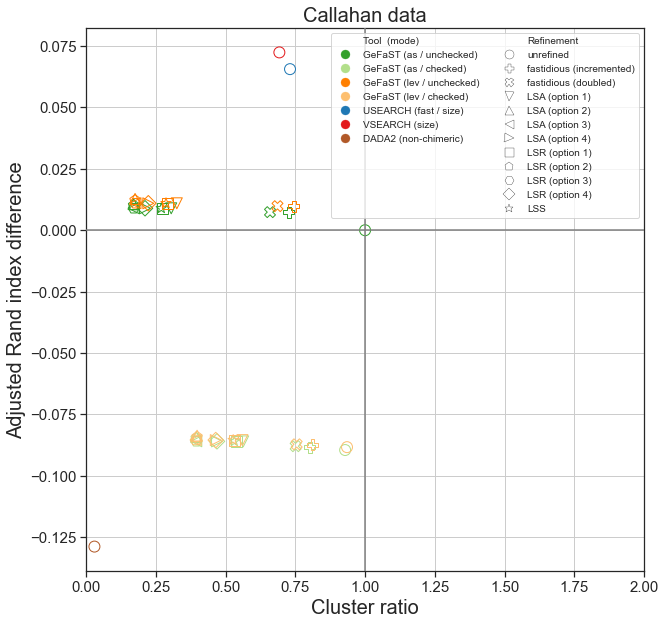

In [34]:
compare_clusters_quality_single(('Callahan data', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', None), ref_param, cmp_param, xmax = 2.0, with_leg = True)

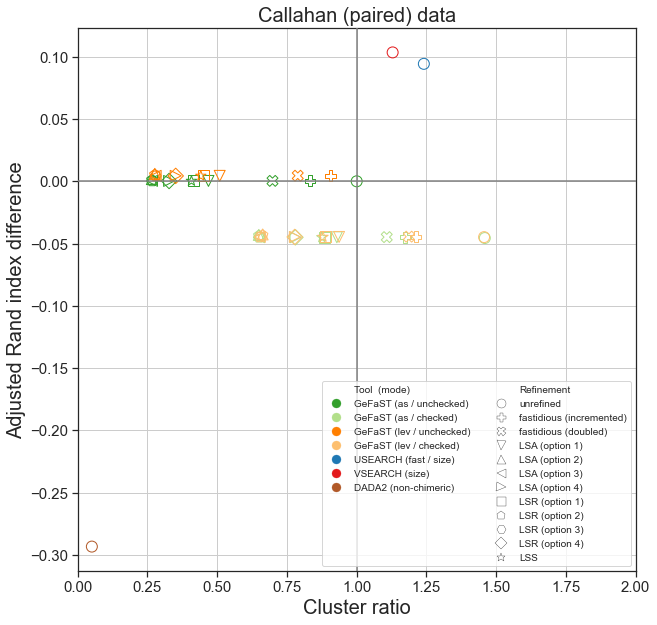

In [35]:
compare_clusters_quality_single(('Callahan (paired) data', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', ('rt', 'paired')), ref_param, cmp_param, xmax = 2.0, with_leg = True)

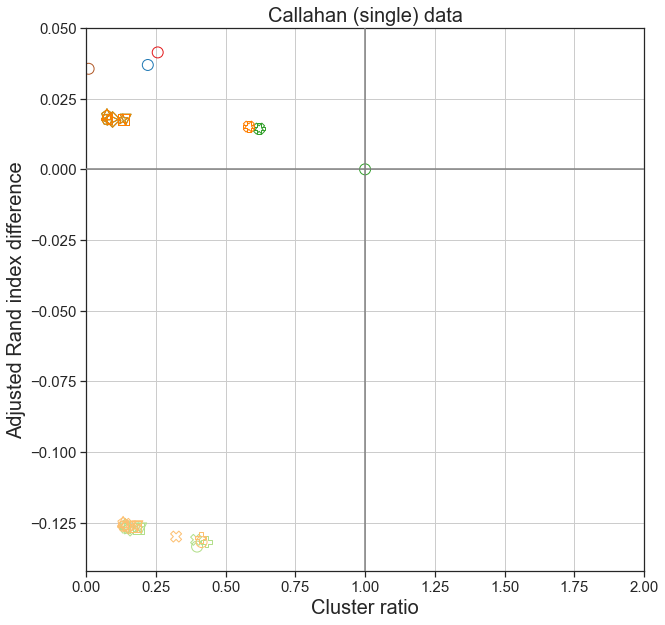

In [36]:
compare_clusters_quality_single(('Callahan (single) data', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', ('rt', 'single')), ref_param, cmp_param, xmax = 2.0, with_leg = False)

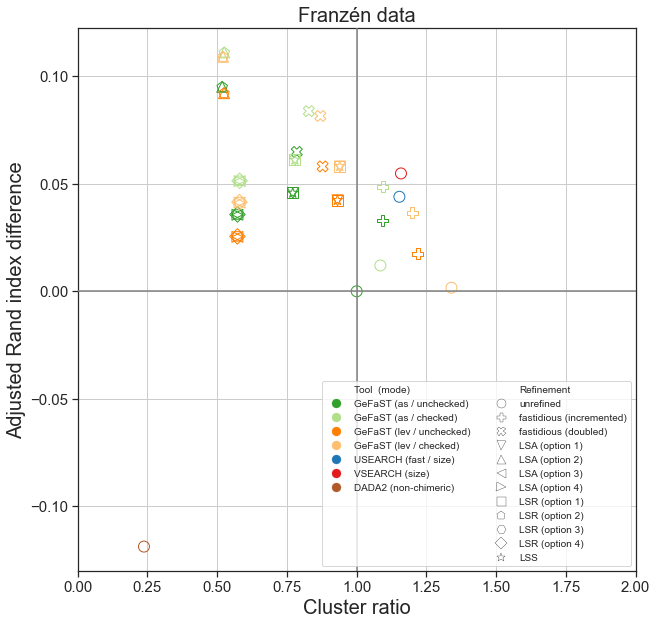

In [37]:
compare_clusters_quality_single(('Franzén data', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', None), ref_param, cmp_param, xmax = 2.0, with_leg = True)

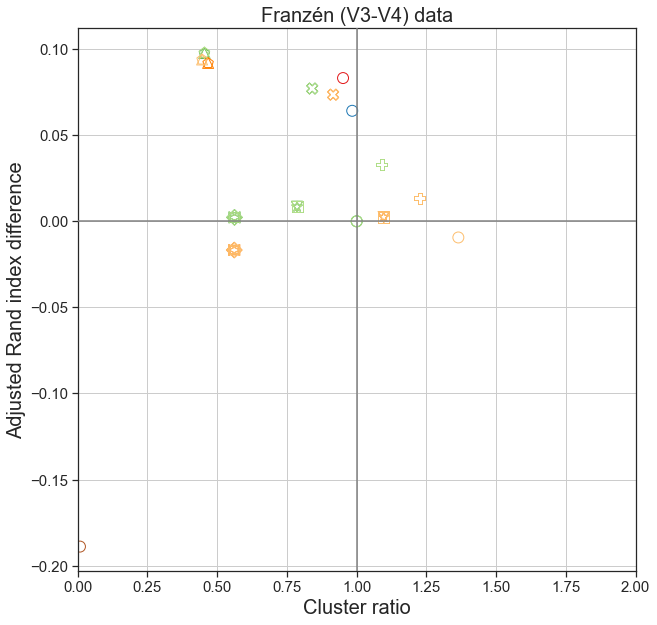

In [38]:
compare_clusters_quality_single(('Franzén (V3-V4) data', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', ('rt', 'V3-V4')), ref_param, cmp_param, xmax = 2.0, with_leg = False)

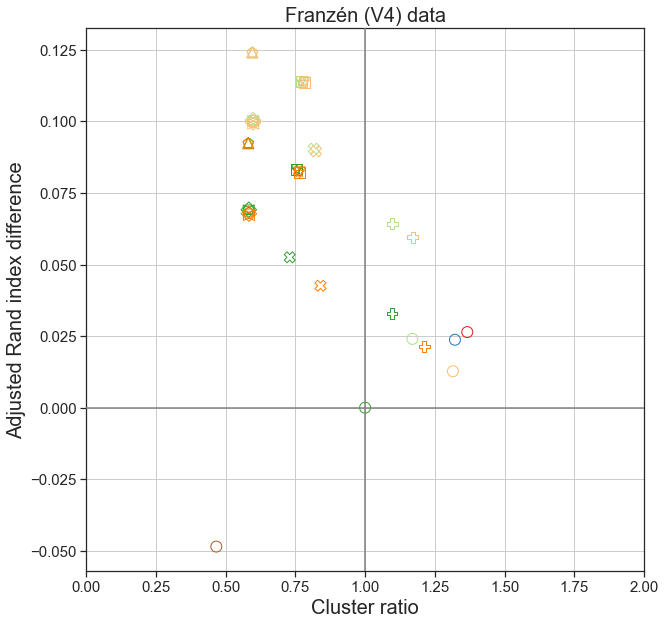

In [39]:
compare_clusters_quality_single(('Franzén (V4) data', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', ('rt', 'V4')), ref_param, cmp_param, xmax = 2.0, with_leg = False)

-- as single plots, with cons mode

In [40]:
ref_param = ('gefast', 'gefast', 'as', 'nf')
cmp_param =  [('gefast', 'gefast', 'as', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'as_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'lev', ['f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'lev_dada2-c', ['nf', 'f1', '2f', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']), 
              ('gefast', 'gefast', 'dada2-s', ['nf', 'lsa1', 'lsa2', 'lsa3', 'lsa4', 'lsr1', 'lsr2', 'lsr3', 'lsr4', 'lss']),
              ('uvsearch', 'usearch', 'fast_size', ['nf']),
              ('uvsearch', 'vsearch', 'size', ['nf']),
              ('dada2', 'dada2', 'non-chimeric', ['nf'])
             ]

OUTLIER: portion = Callahan data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 5.529134, quality_diff = -0.115985


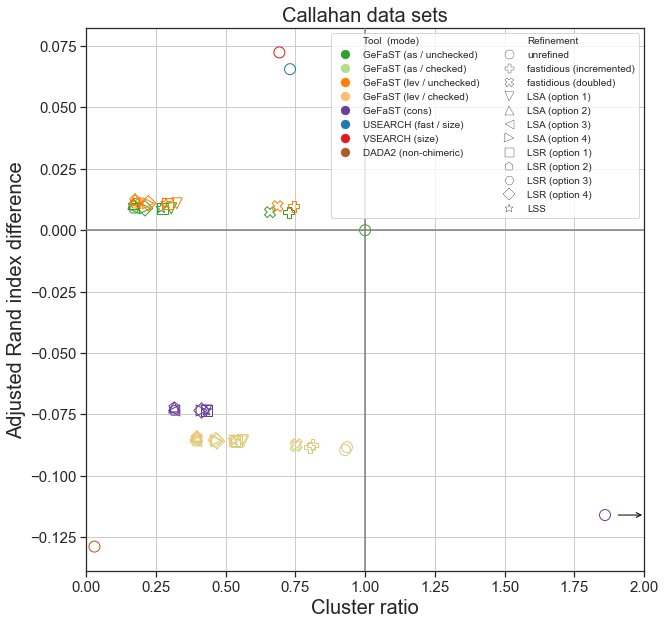

In [41]:
compare_clusters_quality_single(('Callahan data sets', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', None), ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (paired) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 8.309979, quality_diff = -0.055683


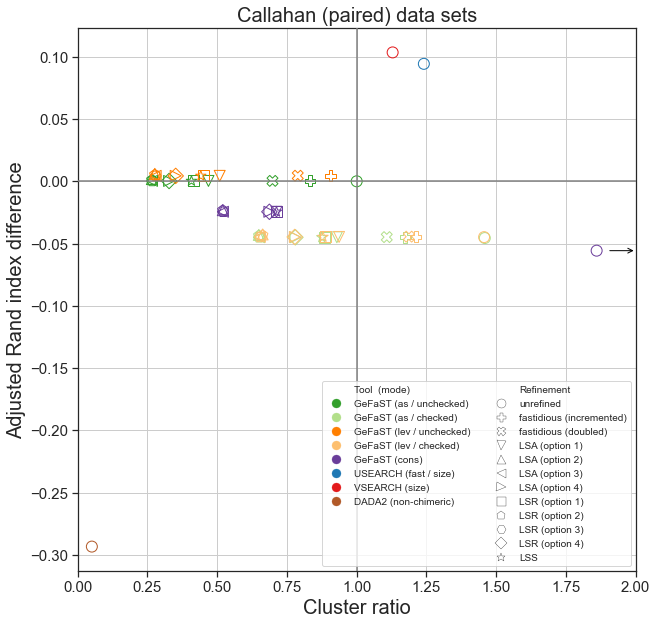

In [42]:
compare_clusters_quality_single(('Callahan (paired) data sets', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', ('rt', 'paired')), ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Callahan (single) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 2.748288, quality_diff = -0.176287


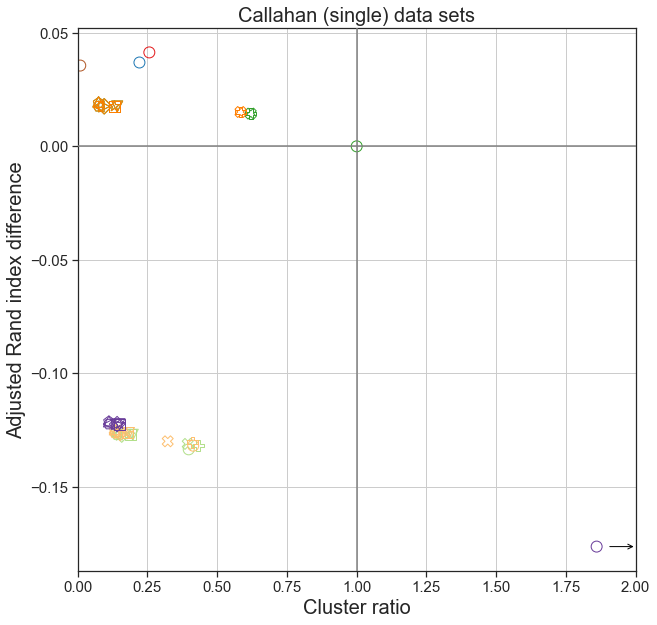

In [43]:
compare_clusters_quality_single(('Callahan (single) data sets', {'gefast': df_callahan_gefast_joined_max_avg, 'uvsearch': df_callahan_uvsearch_joined_max_avg, 'dada2': df_callahan_dada2_joined_max_avg}, 'callahan', ('rt', 'single')), ref_param, cmp_param, xmax = 2.0, with_leg = False)

OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 12.744000, quality_diff = -0.674668
OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 7.246749, quality_diff = -0.328238
OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 7.246749, quality_diff = -0.328238
OUTLIER: portion = Franzén data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 7.246749, quality_diff = -0.328238


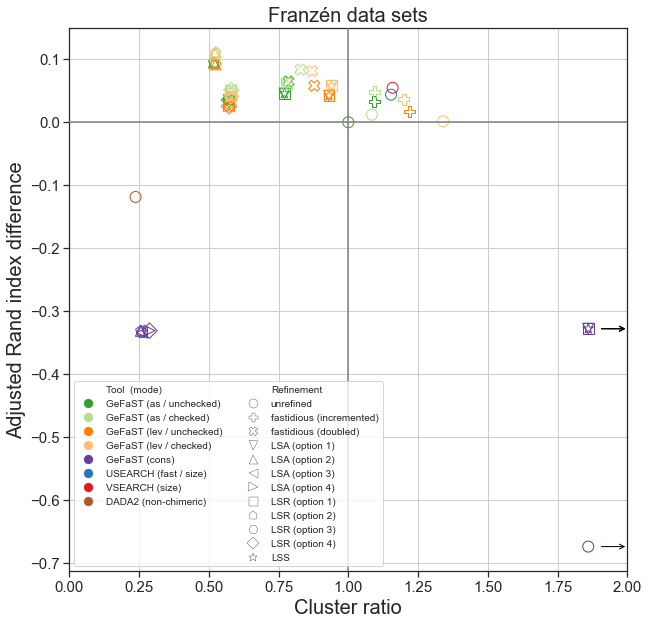

In [44]:
compare_clusters_quality_single(('Franzén data sets', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', None), ref_param, cmp_param, xmax = 2.0, with_leg = True)

OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 14.177467, quality_diff = -0.680766
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsa1 --> cluster_ratio = 13.885583, quality_diff = -0.670359
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lsr1 --> cluster_ratio = 13.885583, quality_diff = -0.670359
OUTLIER: portion = Franzén (V3-V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = lss --> cluster_ratio = 13.885583, quality_diff = -0.670359


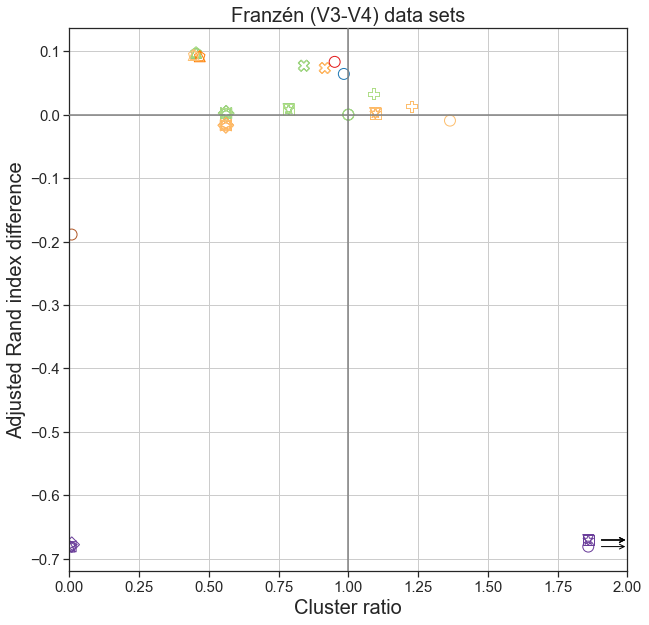

In [45]:
compare_clusters_quality_single(('Franzén (V3-V4) data sets', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', ('rt', 'V3-V4')), ref_param, cmp_param, xmax = 2.0, with_leg = False)

OUTLIER: portion = Franzén (V4) data sets, metric = adjrandindex, mode = dada2-s, refinement = nf --> cluster_ratio = 11.310533, quality_diff = -0.668570


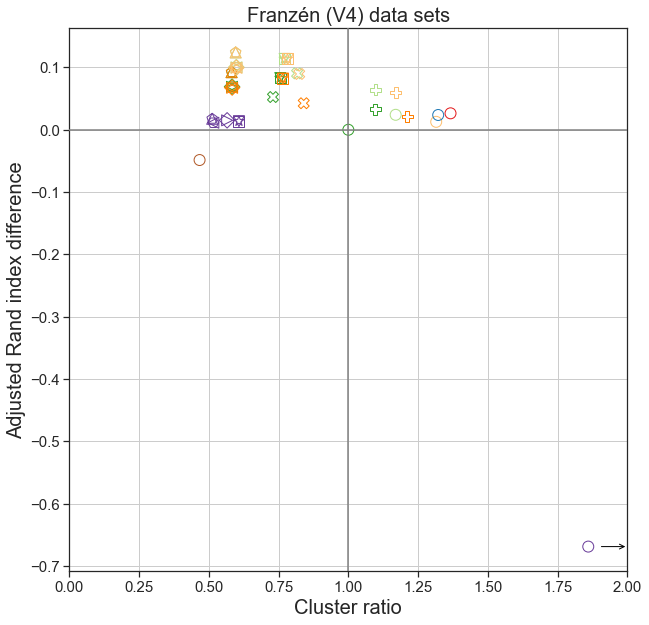

In [46]:
compare_clusters_quality_single(('Franzén (V4) data sets', {'gefast': df_franzen_gefast_joined_max_avg, 'uvsearch': df_franzen_uvsearch_joined_max_avg, 'dada2': df_franzen_dada2_joined_max_avg}, 'franzen', ('rt', 'V4')), ref_param, cmp_param, xmax = 2.0, with_leg = False)